# Data Assessment & Analytics
Notes:
- change os directory location
- be aware of the number of provdied native source data files

In [1]:
# working with data
import os
import numpy as np
import pandas as pd
import geopandas as gpd # the library that lets us read in shapefiles
import geoplot as gplt # for plotting maps
import geoplot.crs as gcrs #used to pull in webdata

# visulizaiton
import missingno as msno # creates a matrix chart to show missing values
import plotly.express as px
import plotly.graph_objects as go # for subplot creation
from plotly.subplots import make_subplots # for subplot creation
import matplotlib.pyplot as mplt # use with gplt to save fig to pdf

# Cleanup
from datetime import datetime
pd.set_option('display.max_columns', 999)  # How to display all columns of a Pandas DataFrame in Jupyter Notebook

In [2]:
# Set Working Directory
workingDir = "G:/Shared drives/WaDE Data/California/WaterAllocation" # change here
os.chdir(workingDir)

In [3]:
# This needs to be custom per state

# Input Data
#################################################################
# Data 1: ewrims_flat_file_pod
df1 = pd.read_csv('RawinputData/current_CAwr Points of Diversion LIST (Detail Summary List)/ewrims_flat_file_pod.zip')

C:\Users\rjame\AppData\Local\Temp\ipykernel_16544\1981141684.py:6: DtypeWarning: Columns (16,56,64,69,75,77,88,91,92,94,97,99,101,106,108,113,124,129,148,157,158,159,160,161) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('RawinputData/current_CAwr Points of Diversion LIST (Detail Summary List)/ewrims_flat_file_pod.zip')


In [4]:
# Input Data - Processed WaDE Input files
#################################################################
dfws = pd.read_csv("ProcessedInputData/watersources.csv").replace(np.nan, "")
dfwspurge = pd.read_csv("ProcessedInputData/watersources_missing.csv").replace(np.nan, "")

dfs = pd.read_csv("ProcessedInputData/sites.csv").replace(np.nan, "")
dfspurge = pd.read_csv("ProcessedInputData/sites_missing.csv").replace(np.nan, "")

dfaa = pd.read_csv("ProcessedInputData/waterallocations.csv").replace(np.nan, "")
dfaapurge = pd.read_csv("ProcessedInputData/waterallocations_missing.csv").replace(np.nan, "")

## Removed Records

In [5]:
print("Records Removed from water source Info")
if len(dfwspurge) != 0:
    for x in dfwspurge['ReasonRemoved'].sort_values().unique():
        print(f'"' + str(x) + '",')
else:
    print("...nothing removed.")

Records Removed from water source Info
"Unused WaterSource Record",


In [6]:
print("Records Removed from site Info")
if len(dfspurge) != 0:
    for x in dfspurge['ReasonRemoved'].sort_values().unique():
        print(f'"' + str(x) + '",')
else:
    print("...nothing removed.")

Records Removed from site Info
"Incomplete or bad entry for Latitude",


In [7]:
print("Records Removed from Allocation Amount Info")
if len(dfaapurge) != 0:
    for x in dfaapurge['ReasonRemoved'].sort_values().unique():
        print(f'"' + str(x) + '",')
else:
    print("...nothing removed.")

Records Removed from Allocation Amount Info
"Incomplete or bad entry for SiteUUID",


# Water Source Info
- watersources.csv

In [8]:
print(len(dfws))
dfws.head(1)

8330


,WaterSourceUUID,Geometry,GNISFeatureNameCV,WaterQualityIndicatorCV,WaterSourceName,WaterSourceNativeID,WaterSourceTypeCV
0,CAwr_WSwadeID1,,,Fresh,Unnamed Stream,wadeID1,Surface


<AxesSubplot: >

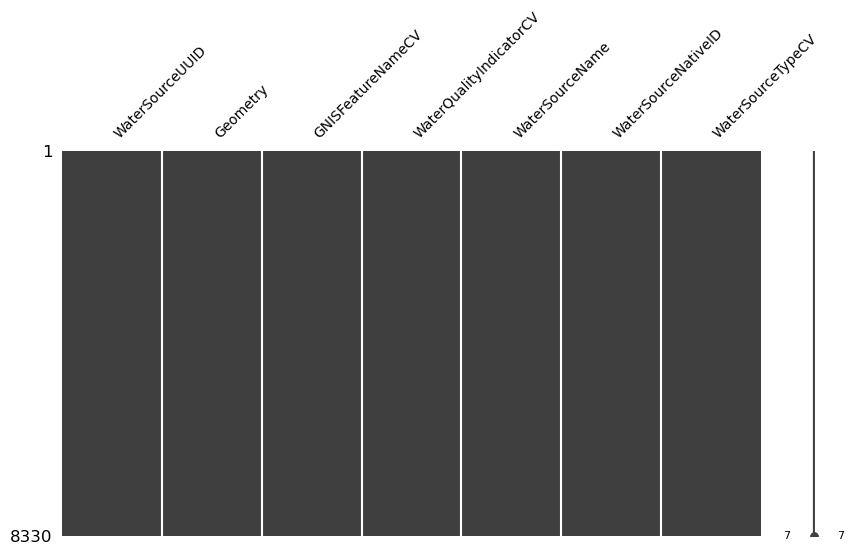

In [9]:
# Check what columns contain missing information.
msno.matrix(dfws, figsize=(10,5), fontsize=10)

In [10]:
# Unique values for 'WaterSourceTypeCV'
for x in dfws['WaterSourceTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Subsurface",
"Surface",
"WaDE Blank",


In [11]:
# WaterSourceTypeCV: histogram distribution of WaDE values
print(dfws.WaterSourceTypeCV.value_counts())

fig = px.histogram(dfws, x="WaterSourceTypeCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of WaterSourceTypeCV Entries in watersource.csv",
                  xaxis_title="WaterSourceTypeCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/WaterSourceTypeCV.pdf', engine="kaleido")

WaDE Blank    5778
Surface       2482
Subsurface      70
Name: WaterSourceTypeCV, dtype: int64


# Site Info
- sites.csv

In [12]:
print(len(dfs))
dfs.head(1)

47634


,SiteUUID,RegulatoryOverlayUUIDs,WaterSourceUUIDs,CoordinateAccuracy,CoordinateMethodCV,County,EPSGCodeCV,Geometry,GNISCodeCV,HUC12,HUC8,Latitude,Longitude,NHDNetworkStatusCV,NHDProductCV,PODorPOUSite,SiteName,SiteNativeID,SitePoint,SiteTypeCV,StateCV,USGSSiteID
0,CAwr_S1,,CAwr_WSwadeID49,WaDE Blank,GIS_CLICK,Humboldt,4326,,,1.801010e+11,18010102.0,40.9631,-124.1,,,POD,WaDE Blank,1,,Point Of Direct Diversion,CA,


<AxesSubplot: >

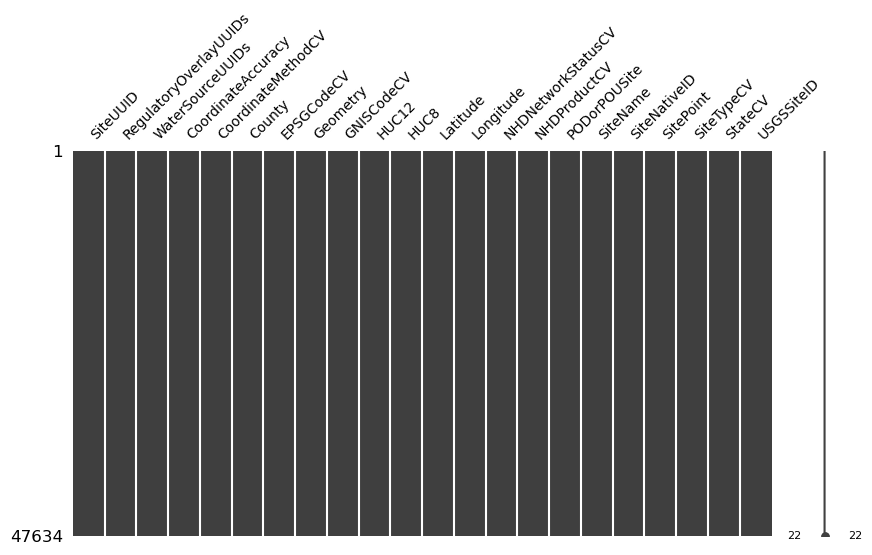

In [13]:
# Check what columns contain missing information.
msno.matrix(dfs, figsize=(10,5), fontsize=10)

In [14]:
# Unique values for 'CoordinateMethodCV'
for x in dfs['CoordinateMethodCV'].sort_values().unique():
    print(f'"' + x + '",')

"DD_NE",
"DD_QQS",
"DD_QS",
"DD_S",
"GIS_BDO",
"GIS_CLICK",
"GIS_DDO",
"GIS_LL",
"GIS_NE",
"GIS_UTM",


In [15]:
# Unique values for 'SiteTypeCV'
for x in dfs['SiteTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Movable Point Of Diversion",
"Movable Point Of Rediversion",
"Point Of Direct Diversion",
"Point Of Diversion To Offstream Storage",
"Point Of Diversion To Underground Storage",
"Point Of Onstream Storage",
"Point Of Rediversion",
"Point Of Storage - Unspecified",
"WaDE Blank",


In [16]:
# SiteTypeCV: histogram distribution of WaDE values
print(dfs.SiteTypeCV.value_counts())

fig = px.histogram(dfs, x="SiteTypeCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of SiteTypeCV Entries in sites.csv",
                  xaxis_title="SiteTypeCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/SiteTypeCV.pdf', engine="kaleido")

Point Of Direct Diversion                    21347
Point Of Storage - Unspecified               19652
WaDE Blank                                    3912
Point Of Onstream Storage                     1121
Point Of Diversion To Offstream Storage       1084
Movable Point Of Diversion                     345
Point Of Rediversion                            92
Point Of Diversion To Underground Storage       79
Movable Point Of Rediversion                     2
Name: SiteTypeCV, dtype: int64


In [17]:
# PODorPOUSite: histogram distribution of WaDE values
print(dfs.PODorPOUSite.value_counts())

fig = px.histogram(dfs, x="PODorPOUSite")
fig.update_layout(bargap=0.2,
                  title="Histogram of PODorPOUSite Entries in sites.csv",
                  xaxis_title="PODorPOUSite Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/PODorPOUSite.pdf', engine="kaleido")

POD    47634
Name: PODorPOUSite, dtype: int64


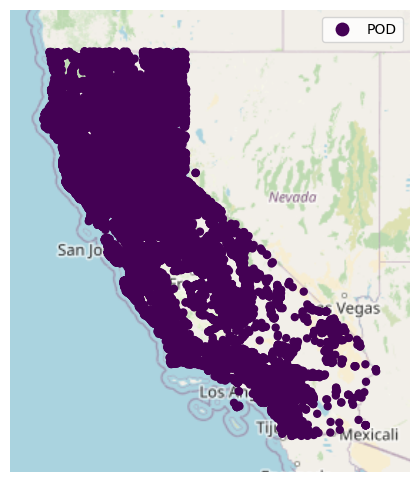

In [18]:
# map the site info (this would be lat & long Points only)
try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot
    
    dfsPoint = dfs.copy()
    gdfsPoint = gpd.GeoDataFrame(dfsPoint, geometry=gpd.points_from_xy(dfsPoint.Longitude.astype(float), dfsPoint.Latitude.astype(float)), crs="EPSG:4326")
    gplt.pointplot(gdfsPoint, hue='PODorPOUSite', legend=True, legend_var='hue', ax=ax)
    mplt.savefig(format="pdf", fname='DataAssessment/figures/PointMap.pdf')
    
except:
    print('No point data to plot')

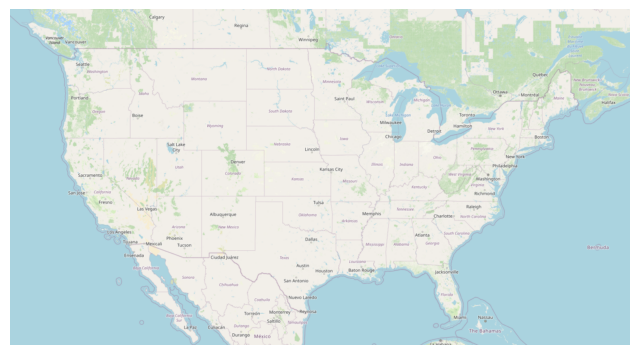

In [19]:
# Map poly info
try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot
    
    dfsPoly = dfs.copy()
    dfsPoly = dfsPoly[dfsPoly['Geometry'] != ""].reset_index(drop=True)
    dfsPoly['Geometry'] = gpd.GeoSeries.from_wkt(dfsPoly['Geometry'], crs="EPSG:4326")
    gdfsPoly = gpd.GeoDataFrame(dfsPoly, geometry=dfsPoly['Geometry'], crs="EPSG:4326") # covert to geodataframe
    gdfsPoly['Geometry'] = gdfsPoly.simplify(0.001) # simplify the geometry. Lower the number the larger the exported file.
    gplt.polyplot(gdfsPoly, ax=ax)
    mplt.savefig(format="pdf", fname='DataAssessment/figures/PolyMap.pdf')
except:
    print('No geometry data to plot')

In [20]:
dfsPoly.head()

,SiteUUID,RegulatoryOverlayUUIDs,WaterSourceUUIDs,CoordinateAccuracy,CoordinateMethodCV,County,EPSGCodeCV,Geometry,GNISCodeCV,HUC12,HUC8,Latitude,Longitude,NHDNetworkStatusCV,NHDProductCV,PODorPOUSite,SiteName,SiteNativeID,SitePoint,SiteTypeCV,StateCV,USGSSiteID,geometry


# Allocation Amount Info
- waterallocations.csv

In [21]:
print(len(dfaa))
dfaa.head(1)

41334


,AllocationUUID,MethodUUID,OrganizationUUID,SiteUUID,VariableSpecificUUID,AllocationApplicationDate,AllocationAssociatedConsumptiveUseSiteIDs,AllocationAssociatedWithdrawalSiteIDs,AllocationBasisCV,AllocationChangeApplicationIndicator,AllocationCommunityWaterSupplySystem,AllocationCropDutyAmount,AllocationExpirationDate,AllocationFlow_CFS,AllocationLegalStatusCV,AllocationNativeID,AllocationOwner,AllocationPriorityDate,AllocationSDWISIdentifierCV,AllocationTimeframeEnd,AllocationTimeframeStart,AllocationTypeCV,AllocationVolume_AF,BeneficialUseCategory,CommunityWaterSupplySystem,CropTypeCV,CustomerTypeCV,DataPublicationDate,DataPublicationDOI,ExemptOfVolumeFlowPriority,GeneratedPowerCapacityMW,IrrigatedAcreage,IrrigationMethodCV,LegacyAllocationIDs,OwnerClassificationCV,PopulationServed,PowerType,PrimaryBeneficialUseCategory,WaterAllocationNativeURL
0,CAwr_WRA000016,CAwr_M1,CAwr_O1,"CAwr_S404,CAwr_S34881,CAwr_S17603,CAwr_S29028",CAwr_V1,,,,WaDE Blank,,,,,0.0,Licensed,A000016,Lilac Hills Estates Lp,,,12/31,1/1,Appropriative_,0.0,Domestic,,,,06/09/2023,,1,,0.0,,,Private,,,Domestic,https://ciwqs.waterboards.ca.gov/ciwqs/ewrims/...


In [22]:
# Unique values for 'AllocationBasisCV'
for x in dfaa['AllocationBasisCV'].sort_values().unique():
    print(f'"' + str(x) + '",')

"WaDE Blank",


In [23]:
# Unique values for 'AllocationTypeCV'
for x in dfaa['AllocationTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Adjudicated_",
"Appropriative_",
"Cert of Right - Power_",
"Federal Claims_",
"Federal Stockponds_",
"Groundwater Recordation_",
"Non Jurisdictional_",
"Not Determined_",
"Registration Cannabis_",
"Registration Domestic_",
"Registration Irrigation_",
"Registration Livestock_",
"Section 12 File_",
"Statement of Div and Use_",
"Statement of Div and Use_COURTADJ",
"Statement of Div and Use_COURTADJ OTHER",
"Statement of Div and Use_OTHER",
"Statement of Div and Use_PENDING",
"Statement of Div and Use_PENDING OTHER",
"Statement of Div and Use_PRE1914",
"Statement of Div and Use_PRE1914 COURTADJ",
"Statement of Div and Use_PRE1914 COURTADJ OTHER",
"Statement of Div and Use_PRE1914 OTHER",
"Statement of Div and Use_RIPERIAN",
"Statement of Div and Use_RIPERIAN COURTADJ",
"Statement of Div and Use_RIPERIAN COURTADJ OTHER",
"Statement of Div and Use_RIPERIAN OTHER",
"Statement of Div and Use_RIPERIAN PENDING",
"Statement of Div and Use_RIPERIAN PENDING OTHER",
"Statement of Div and Use_RIPERI

In [24]:
# Unique values for 'AllocationLegalStatusCV'
for x in dfaa['AllocationLegalStatusCV'].sort_values().unique():
    print(f'"' + x + '",')

"Active",
"Adjudicated",
"Certified",
"Claimed",
"Claimed - Local Oversight",
"Completed",
"Licensed",
"Permitted",
"Registered",
"WaDE Blank",


In [25]:
# Unique values for 'BeneficialUseCategory'
uniqueList = list(set([i.strip() for i in ','.join(dfaa['BeneficialUseCategory'].astype(str)).split(',')]))
uniqueList.sort()
uniqueList

['Aesthetic',
 'Aquaculture',
 'Domestic',
 'Dust Control',
 'Fire Protection',
 'Fish And Wildlife Preservation And Enhancement',
 'Frost Protection',
 'Heat Control',
 'Incidental Power',
 'Industrial',
 'Irrigation',
 'Milling',
 'Mining',
 'Municipal',
 'Other',
 'Power',
 'Recreational',
 'Snow Making',
 'Stockwatering',
 'WaDE Blank',
 'Water Quality']

In [26]:
# Unique values for 'OwnerClassificationCV'
for x in dfaa['OwnerClassificationCV'].sort_values().unique():
    print(f'"' + x + '",')

"Bureau Reclamation (USBR)",
"Bureau of Indian Affairs (USBIA)",
"Bureau of Land Management (USBLM)",
"Department of Agriculture (USDA)",
"Fish and Wildlife Service (USFWS)",
"Forest Service (USFS)",
"Military",
"National Park Service (USNPS)",
"Native American",
"Private",
"United States of America",
"WaDE Blank ",


<AxesSubplot: >

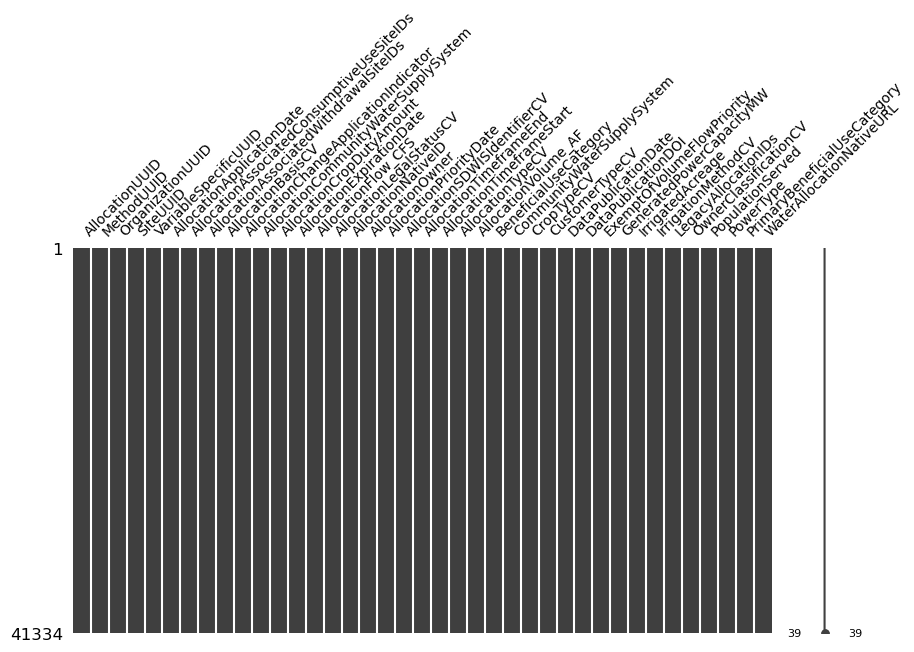

In [27]:
# Check what columns contain missing information.
msno.matrix(dfaa, figsize=(10,5), fontsize=10)

In [28]:
# AllocationFlow_CFS: Boxplot distribution of WaDE values
try:
    trace1 = go.Violin(x=dfaa['AllocationFlow_CFS'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfaa['AllocationFlow_CFS'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(showlegend=False, bargap=0.2, title="AllocationFlow_CFS Distribution in waterallocations.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="AllocationFlow_CFS Value", row=1, col=1)
    fig.update_xaxes(title_text="AllocationFlow_CFS Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records", row=2, col=1)
    fig.show()
    fig.write_image('DataAssessment/figures/AllocationFlow_CFS.pdf', engine="kaleido")

except: print('Could not plot AllocationFlow_CFS value.')

In [29]:
# AllocationVolume_AF: Boxplot distribution of WaDE values
try:
    trace1 = go.Violin(x=dfaa['AllocationVolume_AF'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfaa['AllocationVolume_AF'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(showlegend=False, bargap=0.2, title="AllocationVolume_AF Distribution in waterallocations.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="AllocationVolume_AF Value", row=1, col=1)
    fig.update_xaxes(title_text="AllocationVolume_AF Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records", row=2, col=1)
    fig.show()
    fig.write_image('DataAssessment/figures/AllocationVolume_AF.pdf', engine="kaleido")

except: print('Could not plot AllocationVolume_AF value.')

In [30]:
# AllocationLegalStatusCV: histogram distribution of WaDE values
print(dfaa.AllocationLegalStatusCV.value_counts())

fig = px.histogram(dfaa, x="AllocationLegalStatusCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of AllocationLegalStatusCV Entries in waterallocations.csv",
                  xaxis_title="AllocationLegalStatusCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/AllocationLegalStatusCV.pdf', engine="kaleido")

Claimed                      20528
Licensed                     10544
Certified                     5745
Registered                    2035
Permitted                     1450
Claimed - Local Oversight      819
Active                         165
Adjudicated                     25
WaDE Blank                      17
Completed                        6
Name: AllocationLegalStatusCV, dtype: int64


In [31]:
# OwnerClassificationCV: histogram distribution of WaDE values
print(dfaa.OwnerClassificationCV.value_counts())

fig = px.histogram(dfaa, x="OwnerClassificationCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of OwnerClassificationCV Entries in waterallocations.csv",
                  xaxis_title="OwnerClassificationCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/OwnerClassificationCV.pdf', engine="kaleido")

WaDE Blank                           25456
Private                               8954
National Park Service (USNPS)         3528
Bureau of Land Management (USBLM)     2362
Forest Service (USFS)                  353
Department of Agriculture (USDA)       323
Fish and Wildlife Service (USFWS)      223
Bureau Reclamation (USBR)               77
Native American                         42
United States of America                 8
Military                                 7
Bureau of Indian Affairs (USBIA)         1
Name: OwnerClassificationCV, dtype: int64


In [32]:
# PrimaryBeneficialUseCategory: histogram distribution of WaDE values
print(dfaa.PrimaryBeneficialUseCategory.value_counts())

fig = px.histogram(dfaa, x="PrimaryBeneficialUseCategory")
fig.update_layout(bargap=0.2,
                  title="Histogram of PrimaryBeneficialUseCategory Entries in waterallocations.csv",
                  xaxis_title="PrimaryBeneficialUseCategory Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/PrimaryBeneficialUseCategory.pdf', engine="kaleido")

Domestic                  10035
Agriculture Irrigation     9986
Livestock                  8067
In-stream Flow             3501
Other                      3040
Fire                       2241
Unspecified                2085
Recreation                  857
Hydroelectric               448
Public Supply               405
Aquaculture                 311
Commercial/Industrial       201
Municipal Irrigation         77
Mining                       42
Thermoelectric Cooling       34
Snow                          4
Name: PrimaryBeneficialUseCategory, dtype: int64


In [33]:
# ExemptOfVolumeFlowPriority: histogram distribution of WaDE values
print(dfaa.ExemptOfVolumeFlowPriority.value_counts())

fig = px.histogram(dfaa, x="ExemptOfVolumeFlowPriority")
fig.update_layout(bargap=0.2,
                  title="Histogram of ExemptOfVolumeFlowPriority Entries in waterallocations.csv",
                  xaxis_title="ExemptOfVolumeFlowPriority Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/ExemptOfVolumeFlowPriority.pdf', engine="kaleido")

1    39009
0     2325
Name: ExemptOfVolumeFlowPriority, dtype: int64


In [34]:
# AllocationPriorityDate: histogram distribution of WaDE values
print(dfaa.AllocationPriorityDate.value_counts())

dfaaCopy = dfaa.copy()
dfaaCopy = dfaaCopy[(dfaaCopy['ExemptOfVolumeFlowPriority'] < 1)]
dfaaCopy = dfaaCopy.reset_index(drop=True)
fig = px.histogram(dfaaCopy, x="AllocationPriorityDate")
fig.update_layout(bargap=0.2,
                  title="Histogram of AllocationPriorityDate Entries in waterallocations.csv",
                  xaxis_title="AllocationPriorityDate Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/AllocationPriorityDate.pdf', engine="kaleido")

              39009
2013-05-14       15
2013-05-23       15
2017-04-20       13
1922-07-28       12
              ...  
1999-02-18        1
1999-02-17        1
1999-02-08        1
1998-12-09        1
1928-03-16        1
Name: AllocationPriorityDate, Length: 1498, dtype: int64


In [35]:
# merge all figure pdfs into single output pdf

'''
Notes:
'merger' is used for merging multiple files into one and merger.append(absfile) will append 
 the files one by one until all pdfs are appended in the result file.
'''

from PyPDF2 import PdfFileMerger

# If files are saved in the folder 'C:\Users' then Full_Path will be replaced with C:\Users
filePath = str(os.getcwd()) + '/DataAssessment/figures'
pdfsList = os.listdir(filePath)
print(pdfsList)


# os.listdir will create the list of all files in a directory
merger = PdfFileMerger(strict=False)

for file in pdfsList:
    if file.endswith(".pdf"):
        path_with_file = os.path.join(filePath, file)
        print(path_with_file)
        merger.append(path_with_file,  import_bookmarks=False )
merger.write("DataAssessment/Figures Merged Copy.pdf")

merger.close()

['WaterSourceTypeCV.pdf', 'SiteTypeCV.pdf', 'PODorPOUSite.pdf', 'PointMap.pdf', 'PolyMap.pdf', 'AllocationFlow_CFS.pdf', 'AllocationVolume_AF.pdf', 'AllocationLegalStatusCV.pdf', 'OwnerClassificationCV.pdf', 'PrimaryBeneficialUseCategory.pdf', 'ExemptOfVolumeFlowPriority.pdf', 'AllocationPriorityDate.pdf']
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\WaterSourceTypeCV.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\SiteTypeCV.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\PODorPOUSite.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\PointMap.pdf


C:\Users\rjame\anaconda3\lib\site-packages\PyPDF2\_utils.py:411: UserWarning:

import_bookmarks is deprecated as an argument. Use import_outline instead



G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\PolyMap.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\AllocationFlow_CFS.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\AllocationVolume_AF.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\AllocationLegalStatusCV.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\OwnerClassificationCV.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\PrimaryBeneficialUseCategory.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\ExemptOfVolumeFlowPriority.pdf
G:\Shared drives\WaDE Data\California\WaterAllocation/DataAssessment/figures\AllocationPriorityDate.pdf


# Removed Records compared to Source Data
- this is working just fine
- just want to comment out temporarily

In [36]:
# Explode purge.xlsx files by WaDEUUID, concat together
#################################################################

# Explode watersources_missing.xlsx records by WaDEUUID
dfwspurgeCopy = dfwspurge.assign(WaDEUUID=dfwspurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
dfwspurgeCopy = dfwspurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# Explode sites_missing.xlsx records by WaDEUUID
dfspurgeCopy = dfspurge.assign(WaDEUUID=dfspurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
dfspurgeCopy = dfspurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# Explode waterallocations_missing.xlsx records by WaDEUUID
dfaapurgeCopy = dfaapurge.assign(WaDEUUID=dfaapurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
dfaapurgeCopy = dfaapurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# concat purge dataframes togehter
frames = [dfwspurgeCopy, dfspurgeCopy, dfaapurgeCopy] 
dfWaDEUUID = pd.concat(frames)
dfWaDEUUID = dfWaDEUUID.drop_duplicates().reset_index(drop=True).replace(np.nan, "")
print(len(dfWaDEUUID))
dfWaDEUUID.head(1)

5643


,WaDEUUID,ReasonRemoved,IncompleteField
0,caD34551,Unused WaterSource Record,


In [37]:
# this is custom to the provided data

# attach purge dataframe to Native Source Data
# df1: Permits
#################################################################

if 'ReasonRemoved' in df1:
    df1 = df1.drop(['ReasonRemoved', 'IncompleteField'], axis=1)

df1Copy = dfWaDEUUID.merge(df1, how='right', on='WaDEUUID')
df1Copy = df1Copy.groupby('WaDEUUID').agg(lambda x: ','.join([str(elem) for elem in (list(set(x))) if elem!=''])).replace(np.nan, "").reset_index()
df1Copy.to_csv('RawInputData/current_CAwr Points of Diversion LIST (Detail Summary List)/ewrims_flat_file_pod.zip', compression=dict(method='zip', archive_name='ewrims_flat_file_pod.csv'), index=False)

# Custom Queries and Analysis for this Dataset

In [38]:
# asdf